### Figure 6 and 7 notebook for plotting MERFISH integration with MACA scRNA-seq atlas

In [28]:
import os
import pandas as pd
import matplotlib as mpl
from matplotlib import pyplot as plt
import numpy as np
import anndata as ad
import scanpy as sc
import seaborn as sns
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.lines import Line2D
from skimage.measure import block_reduce
import tifffile
import string
from sklearn.metrics import confusion_matrix

mpl.rcParams.update(mpl.rcParamsDefault) #Reset rcParams to default
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']  # Colors in this style

# Plotting style function (run this before plotting the final figure)
def set_plotting_style():
    plt.style.use('seaborn-paper')
    plt.rc('axes', labelsize=12)
    plt.rc('axes', titlesize=12)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.rc('legend', fontsize=10)
    plt.rc('text.latex', preamble=r'\usepackage{sfmath}')
    plt.rc('xtick.major', pad=2)
    plt.rc('ytick.major', pad=2)
    plt.rc('mathtext', fontset='stixsans', sf='sansserif')
    plt.rc('figure', figsize=[10,9])
    plt.rc('svg', fonttype='none')
    
def set_plotting_style_huge():
    plt.style.use('seaborn-paper')
    plt.rc('axes', labelsize=24)
    plt.rc('axes', titlesize=24)
    plt.rc('xtick', labelsize=20)
    plt.rc('ytick', labelsize=20)
    plt.rc('legend', fontsize=20)
    plt.rc('text.latex', preamble=r'\usepackage{sfmath}')
    plt.rc('xtick.major', pad=4)
    plt.rc('ytick.major', pad=4)
    plt.rc('mathtext', fontset='stixsans', sf='sansserif')
    plt.rc('figure', figsize=[10,9])
    plt.rc('svg', fonttype='none')
        
    
# Function to preprocess raw AnnData object

def preprocess_ad(ad, min_counts):
    ad.layers['counts'] = ad.X.copy()
    sc.pp.filter_cells(ad, min_counts=min_counts)
    sc.pp.normalize_total(ad, target_sum=1e4) # Normalize data
    sc.pp.log1p(ad) # Logarithmize the data
    sc.pp.scale(ad) # Scale each gene to unit variance

In [2]:
# Load data
fileDir = '/mnt/ibm_lg/spatial-seq/vizgen-MACA-comparison-paper/results/'

liver_concat = ad.read_h5ad(fileDir + 'scVI_liver_object.h5ad')
kidney_concat = ad.read_h5ad(fileDir + 'scVI_kidney_object.h5ad')
scanvi_liver = ad.read_h5ad(fileDir + 'scANVI_liver_object.h5ad')
scanvi_kidney = ad.read_h5ad(fileDir + 'scANVI_kidney_object.h5ad')
VizgenLiver = ad.read_h5ad(fileDir + 'MERFISH_liver_object.h5ad')
VizgenKidney = ad.read_h5ad(fileDir + 'MERFISH_kidney_object.h5ad')

# Rotate coordinates for liver to make the aspect ratio nicer
scanvi_liver.obsm['spatial'] = scanvi_liver.obsm['spatial'][:,[1,0]].copy()
VizgenLiver.obsm['spatial'] = VizgenLiver.obsm['spatial'][:,[1,0]].copy()

# Remap cell type labels to coarse groups
liver_relabel_map = {'B cell': 'immune cell',
                    'NK cell': 'immune cell',
                    'periportal endothelial cell': 'periportal endothelial cell',
                    'pericentral endothelial cell': 'pericentral endothelial cell',
                    'other endothelial cell': 'other endothelial cell',
                    'myeloid leukocyte': 'immune cell',
                    'plasmacytoid dendritic cell': 'immune cell',
                    'Kupffer cell': 'Kupffer cell',
                    'hepatic stellate cell': 'hepatic stellate cell',
                    'other hepatocyte': 'other hepatocyte',
                    'periportal hepatocyte': 'periportal hepatocyte',
                    'pericentral hepatocyte': 'pericentral hepatocyte'}
kidney_relabel_map = {'macrophage': 'immune cell',
                     'lymphocyte': 'immune cell',
                     'glomerular capillary endothelial cell': 'endothelial cell',
                     'kidney blood vessel cell': 'endothelial cell',
                     'plasma cell': 'immune cell',
                     'epithelial cell of proximal tubule': 'epithelial cell of proximal tubule',
                     'kidney loop of Henle epithelial cell': 'kidney loop of Henle epithelial cell',
                     'kidney distal convoluted tubule epithelial cell': 'kidney distal convoluted tubule epithelial cell',
                     'kidney collecting duct epithelial cell': 'kidney collecting duct epithelial cell',
                     'pericyte': 'pericyte',
                     'podocyte': 'podocyte',
                     'fibroblast': 'fibroblast'}

liver_concat.obs['predicted_cell_type'] = liver_concat.obs['predicted_cell_type'].map(liver_relabel_map)
scanvi_liver.obs['predicted_cell_type'] = scanvi_liver.obs['predicted_cell_type'].map(liver_relabel_map)
kidney_concat.obs['predicted_cell_type'] = kidney_concat.obs['predicted_cell_type'].map(kidney_relabel_map)
scanvi_kidney.obs['predicted_cell_type'] = scanvi_kidney.obs['predicted_cell_type'].map(kidney_relabel_map)

# Create abbreviated cell type labels
liver_abbrev_map = {'immune cell': 'IC',
                   'other endothelial cell': 'o-EC',
                   'Kupffer cell': 'KC',
                   'hepatic stellate cell': 'HSC',
                   'other hepatocyte': 'o-hep',
                   'periportal hepatocyte': 'PP-hep',
                   'pericentral hepatocyte': 'PC-hep',
                   'periportal endothelial cell': 'PP-EC',
                   'pericentral endothelial cell': 'PC-EC',
                   'bile duct epithelial cell': 'BD-EC'}
kidney_abbrev_map = {'epithelial cell of proximal tubule':'EC-PT',
                    'immune cell': 'IC',
                    'pericyte':'per',
                    'kidney loop of Henle epithelial cell':'KLH-EC',
                    'kidney collecting duct epithelial cell':'KCD-EC',
                    'kidney distal convoluted tubule epithelial cell':'KDCT-EC',
                    'endothelial cell': 'EC',
                    'podocyte':'pod',
                    'fibroblast':'fib'}

liver_concat.obs['predicted_cell_type_abv'] = liver_concat.obs['predicted_cell_type'].map(liver_abbrev_map)
scanvi_liver.obs['predicted_cell_type_abv'] = scanvi_liver.obs['predicted_cell_type'].map(liver_abbrev_map)
VizgenLiver.obs['free_annotation_abv'] = VizgenLiver.obs['free_annotation'].map(liver_abbrev_map)
kidney_concat.obs['predicted_cell_type_abv'] = kidney_concat.obs['predicted_cell_type'].map(kidney_abbrev_map)
scanvi_kidney.obs['predicted_cell_type_abv'] = scanvi_kidney.obs['predicted_cell_type'].map(kidney_abbrev_map)
VizgenKidney.obs['free_annotation_abv'] = VizgenKidney.obs['free_annotation'].map(kidney_abbrev_map)

print('Results loaded.')

Results loaded.


In [3]:
# DAPI mosaic
experimentName = ['MsLiver_Cellbound_VZG116_V1_JH_09-18-2021', 
                  'MsKidney_CellBoundary_VZG116_111921']
dataPath = '/mnt/ibm_lg/spatial-seq/MERSCOPE/preprocessed_data/'

zInd = 3
z_stack = ['z0','z1','z2','z3','z4','z5','z6']
dscale = 20 # Downsampling factor

dapiMosaic = []
for i in range(len(experimentName)):
    dapiMosaic.append(tifffile.TiffFile(os.path.join(
        dataPath, experimentName[i], "region_0" , "images", 'mosaic_DAPI_' + z_stack[zInd] + '.tif')).asarray())

# Downsample DAPI mosaic using block reduce for low-res plot
dapiMosaicLowRes = []
for i in range(len(experimentName)):
    dapiMosaicLowRes.append(block_reduce(dapiMosaic[i], block_size=(dscale, dscale), func=np.mean))
    
# Rotate the liver image
# Rotate coordinates for liver to make the aspect ratio nicer
dapiMosaicLowRes[0] = dapiMosaicLowRes[0].transpose()

print('DAPI mosaic loaded.')

DAPI mosaic loaded.


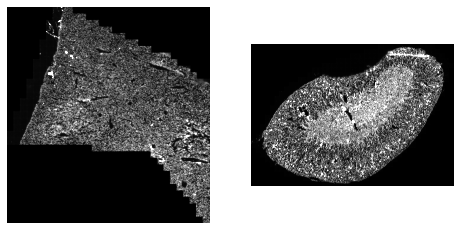

In [4]:
# Plot DAPI mosaics

fig, axes = plt.subplots(1,2, figsize=(8,4))

ax = axes[0]
ax.imshow(dapiMosaicLowRes[0], cmap='gray', vmax=10000)
ax.axis('off')

ax = axes[1]
ax.imshow(dapiMosaicLowRes[1], cmap='gray', vmax=20000)
ax.axis('off')

plt.show()

<Figure size 432x288 with 0 Axes>

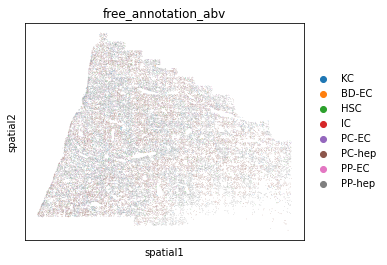

<Figure size 432x288 with 0 Axes>

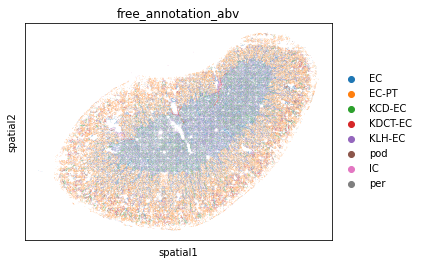

In [5]:
# Plot Vizgen spatial plots
plt.figure()
sc.pl.spatial(VizgenLiver, color='free_annotation_abv', spot_size=10)
plt.show()

plt.figure()
sc.pl.spatial(VizgenKidney, color='free_annotation_abv', spot_size=10)
plt.show()

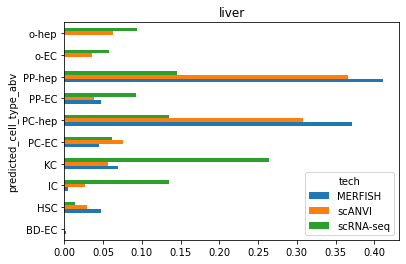

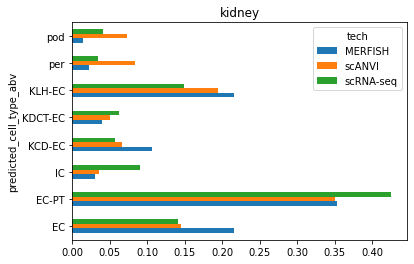

In [6]:
# Cell type frequencies
# Now plot the fraction of cell types for each technology
#Liver

VizgenLiver.obs['predicted_cell_type_abv'] = VizgenLiver.obs['free_annotation_abv'].copy()
VizgenLiver.obs['tech'] = 'MERFISH'
liver_concat.obs['tech'] = liver_concat.obs['tech'].replace('MERFISH','scANVI')
liver_celltypes = pd.concat([liver_concat.obs.loc[:,['tech','predicted_cell_type_abv']],
                            VizgenLiver.obs.loc[:,['tech','predicted_cell_type_abv']]])

# Regroup endothelial subgroups to master group

liver_celltype_counts = liver_celltypes.groupby(by=['tech','predicted_cell_type_abv']).size().unstack().transpose()
liver_celltype_frac = liver_celltype_counts / liver_celltype_counts.sum(axis=0)



liver_celltype_frac.plot.barh(title='liver')
#plt.xticks(rotation=45, ha='right')
plt.show()

# Kidney
VizgenKidney.obs['predicted_cell_type_abv'] = VizgenKidney.obs['free_annotation_abv'].copy()
VizgenKidney.obs['tech'] = 'MERFISH'
kidney_concat.obs['tech'] = kidney_concat.obs['tech'].replace('MERFISH','scANVI')
kidney_celltypes = pd.concat([kidney_concat.obs.loc[:,['tech','predicted_cell_type_abv']],
                            VizgenKidney.obs.loc[:,['tech','predicted_cell_type_abv']]])

kidney_celltype_counts = kidney_celltypes.groupby(by=['tech','predicted_cell_type_abv']).size().unstack().transpose()
kidney_celltype_frac = kidney_celltype_counts / kidney_celltype_counts.sum(axis=0)

kidney_celltype_frac.plot.barh(title='kidney')
#plt.xticks(rotation=45, ha='right')
plt.show()

<AxesSubplot:>

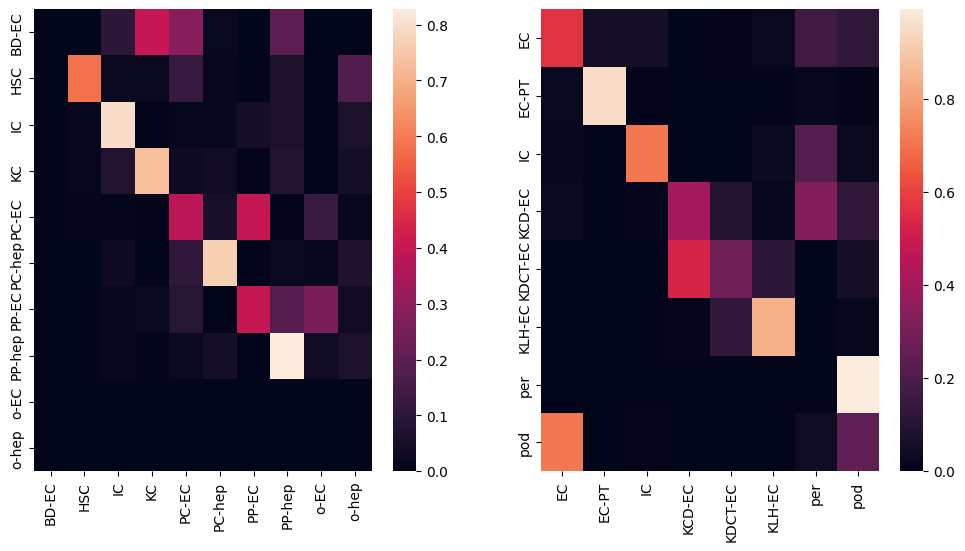

In [30]:
# Calculate cell type confusion matrices

# Make dataframe of cell types between manual and scANVI

# liver
# Copy the scanvi object and make the indices consistent with the MERFISH object
scanvi_liver_fixindex = scanvi_liver.copy()
scanvi_liver_fixindex.obs.index = scanvi_liver_fixindex.obs.index.str.replace('-MERFISH','')

annot_liver = pd.DataFrame(index = VizgenLiver.obs.index)
annot_liver['manual_abv'] = VizgenLiver.obs['free_annotation_abv']
annot_liver['scANVI_abv'] = scanvi_liver_fixindex.obs['predicted_cell_type_abv']

# kidney
# Copy the scanvi object and make the indices consistent with the MERFISH object
scanvi_kidney_fixindex = scanvi_kidney.copy()
scanvi_kidney_fixindex.obs.index = scanvi_kidney_fixindex.obs.index.str.replace('-MERFISH','')

annot_kidney = pd.DataFrame(index = VizgenKidney.obs.index)
annot_kidney['manual_abv'] = VizgenKidney.obs['free_annotation_abv']
annot_kidney['scANVI_abv'] = scanvi_kidney_fixindex.obs['predicted_cell_type_abv']

# Drop nan cells
annot_kidney = annot_kidney.dropna()

# Calculate confusion matrices
liver_celltypes = np.union1d(annot_liver['manual_abv'].unique(),
                             annot_liver['scANVI_abv'].unique())
liver_confusion = pd.DataFrame(index=liver_celltypes,
                               columns=liver_celltypes,
                               data=confusion_matrix(annot_liver['manual_abv'],
                                                     annot_liver['scANVI_abv'],
                                                     labels=liver_celltypes,
                                                     normalize='true'))
kidney_celltypes = np.union1d(annot_kidney['manual_abv'].unique(),
                              annot_kidney['scANVI_abv'].unique())
kidney_confusion = pd.DataFrame(index=kidney_celltypes,
                               columns=kidney_celltypes,
                               data=confusion_matrix(annot_kidney['manual_abv'],
                                                     annot_kidney['scANVI_abv'],
                                                     labels=kidney_celltypes,
                                                     normalize='true'))

# Plot results
fig, axes = plt.subplots(1, 2, figsize=(12,6))
ax = axes[0]
sns.heatmap(liver_confusion, ax=ax)

ax = axes[1]
sns.heatmap(kidney_confusion, ax=ax)


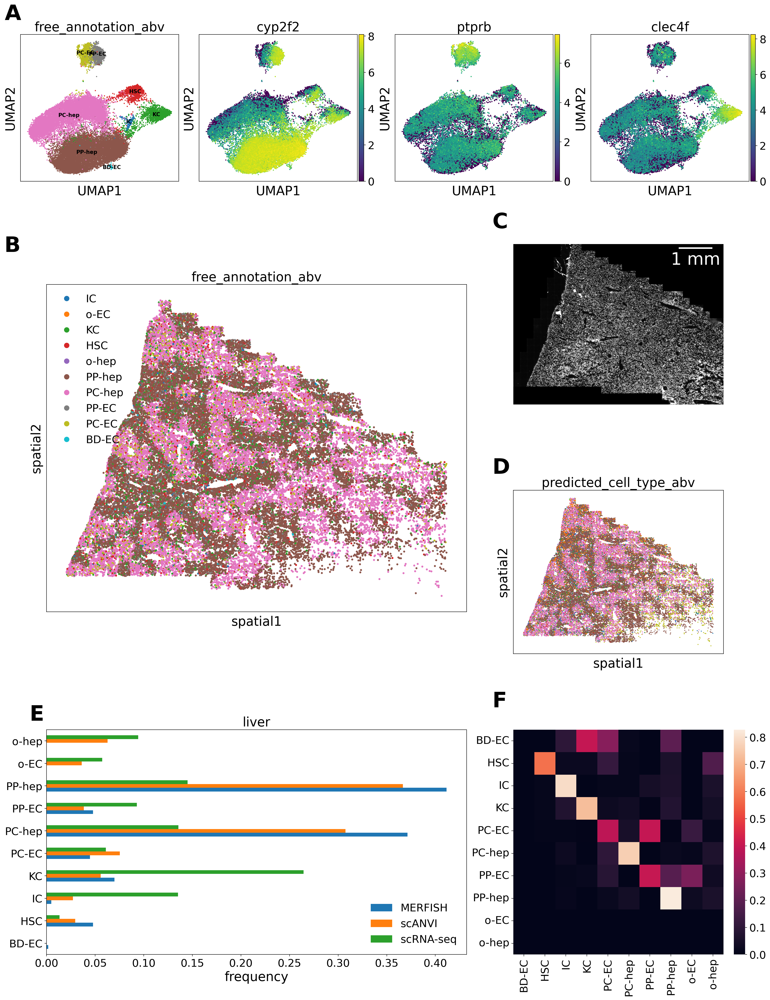

In [34]:
# Plot the liver only (new layout)
sc.set_figure_params(vector_friendly=True, dpi=300, dpi_save=2000)
mpl.rcParams.update(mpl.rcParamsDefault) #Reset rcParams to default
set_plotting_style_huge()

fig6 = plt.figure(figsize=(20,26), constrained_layout=True) # Create figure
subfigs = fig6.subfigures(2,1, height_ratios=[0.25, 1]) # Create subfigures
axes0 = subfigs[0].subplots(1,4) # Axes for top subfigure
axes1 = subfigs[1].subplots(3,3) # Axes for bottom subfigure

# remove the underlying axes for the spatial panel and the last panel
gs = axes1[0,0].get_gridspec() #Get gridspecs
for i in [0,1]:
    for j in [0,1]:
        axes1[i,j].remove()
for i in [2]:
    for j in [0,1,2]:
        axes1[i,j].remove()

axbig1 = subfigs[1].add_subplot(gs[0:2, 0:2])
axbig2 = subfigs[1].add_subplot(gs[2, 0:2])
axbig3 = subfigs[1].add_subplot(gs[2, 2:4])


# Use the same colormap for the cell types between methods
colormap_liver = {list(liver_abbrev_map.values())[x]:
                 mpl.cm.get_cmap('tab10',len(list(liver_abbrev_map.values())))(x) for x in
                 range(len(list(liver_abbrev_map.values())))}


# Panel A: Vizgen liver UMAP
ax = axes0[0]
sc.pl.umap(VizgenLiver, color='free_annotation_abv', ax=ax, show=False, legend_loc='on data',
          palette=colormap_liver, frameon=True, size=20)

ax = axes0[1]
sc.pl.umap(VizgenLiver, color='cyp2f2', ax=ax, show=False, legend_loc=None,
          frameon=True, size=20)

ax = axes0[2]
sc.pl.umap(VizgenLiver, color='ptprb', ax=ax, show=False, legend_loc=None,
          frameon=True, size=20)

ax = axes0[3]
sc.pl.umap(VizgenLiver, color='clec4f', ax=ax, show=False, legend_loc=None,
          frameon=True, size=20)

# Panel B: Vizgen liver spatial plot
ax = axbig1
liver_legend = [Line2D([0], [0], marker='o', color='w', label=list(colormap_liver.keys())[x],
                        markerfacecolor=list(colormap_liver.values())[x], markersize=10)
                for x in range(len(colormap_liver))]
sc.pl.spatial(VizgenLiver, color='free_annotation_abv', spot_size=30, ax=ax, show=False,
             palette=colormap_liver)
ax.legend(handles=liver_legend, loc='upper left', frameon=False)

# Panel C: DAPI spatial plot
size_of_one_pixel = 0.1080000004119873 # Size of one pixel from fig6 2
xMin = 0
xMax = 2200
yMin = 0
yMax = dapiMosaicLowRes[0].shape[1]
ax = axes1[0,2]
ax.imshow(dapiMosaicLowRes[0][xMin:xMax, yMin:yMax], cmap='gray', vmax=10000)
ax.axis('off')
scalebar = ScaleBar(size_of_one_pixel*dscale/1000, "mm", color='w', box_color='k', box_alpha=0, location='upper right', 
                   font_properties={'size':32})
ax.add_artist(scalebar)

# Panel F: scANVI liver spatial plot
ax = axes1[1,2]
sc.pl.spatial(scanvi_liver, color="predicted_cell_type_abv", spot_size=30, ax=ax, show=False,
             palette=colormap_liver, legend_loc=None)

# Panel G: cell type composition for liver
ax = axbig2
liver_celltype_frac.plot.barh(title='liver', ax=ax)
ax.set_ylabel('')
ax.set_xlabel('frequency')
ax.legend(frameon=False)

# Panel H: confusion matrix between manual annotation and scANVI
ax = axbig3
sns.heatmap(liver_confusion, ax=ax)

# Label subpanels
axes_label = [axes0[0], axbig1, axes1[0,2], axes1[1,2], axbig2, axbig3]
for n, ax in enumerate(axes_label):
    if n == 4 or n == 7 or n == 8:
        ax.text(-0.04, 1.04, string.ascii_uppercase[n], transform=ax.transAxes, 
                size=40, weight='bold')
    else:
        ax.text(-0.1, 1.1, string.ascii_uppercase[n], transform=ax.transAxes, 
                size=40, weight='bold')

plt.show()

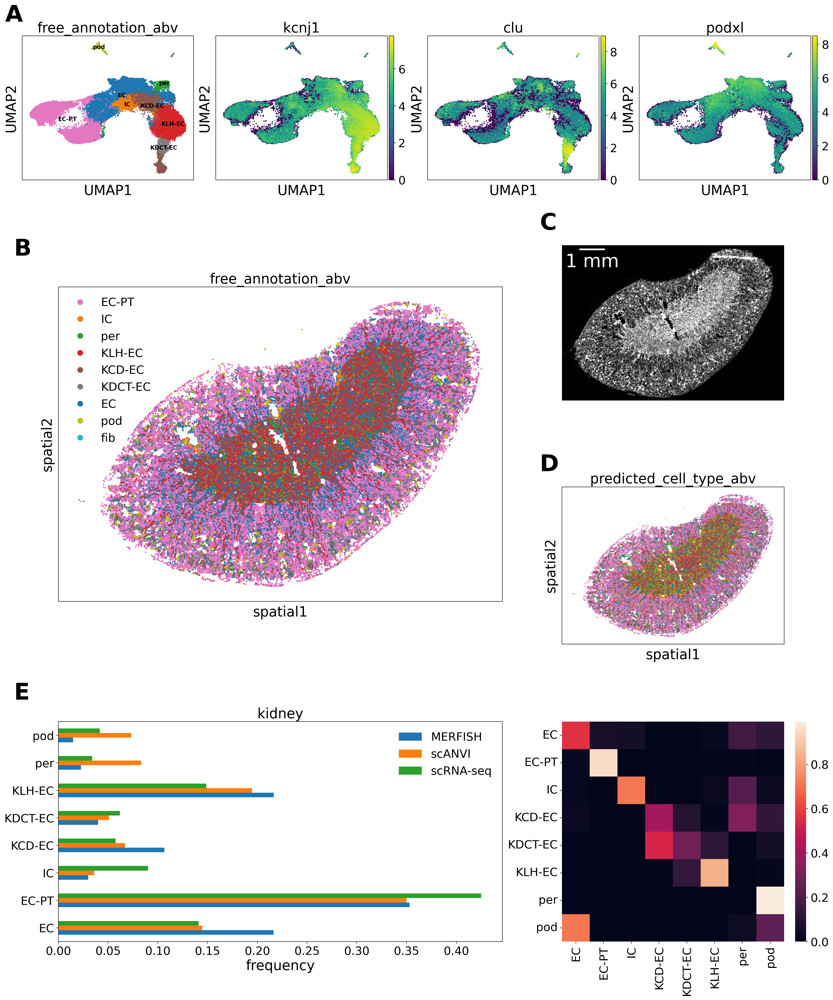

In [35]:
# Plot the kidney only (new layout)

sc.set_figure_params(vector_friendly=True, dpi=300, dpi_save=2000)
mpl.rcParams.update(mpl.rcParamsDefault) #Reset rcParams to default
set_plotting_style_huge()

fig7 = plt.figure(figsize=(20,24), constrained_layout=True) # Create figure
subfigs = fig7.subfigures(2,1, height_ratios=[0.25, 1]) # Create subfigures
axes0 = subfigs[0].subplots(1,4) # Axes for top subfigure
axes1 = subfigs[1].subplots(3,3) # Axes for bottom subfigure

# remove the underlying axes for the spatial panel and the last panel
gs = axes1[0,0].get_gridspec() #Get gridspecs
for i in [0,1]:
    for j in [0,1]:
        axes1[i,j].remove()
for i in [2]:
    for j in [0,1,2]:
        axes1[i,j].remove()

axbig1 = subfigs[1].add_subplot(gs[0:2, 0:2])
axbig2 = subfigs[1].add_subplot(gs[2, 0:2])
axbig3 = subfigs[1].add_subplot(gs[2, 2:4])


# Use the same colormap for the cell types between methods
colormap_kidney = {list(kidney_abbrev_map.values())[x]:
                 mpl.cm.get_cmap('tab10',len(list(kidney_abbrev_map.values())))(x) for x in
                 range(len(list(kidney_abbrev_map.values())))}

# Swap some colors
colormap_kidney['EC-PT'] = 'tab:pink'
colormap_kidney['EC'] = 'tab:blue'
colormap_kidney['KDCT-EC'] = 'tab:gray'


# Panel A: Vizgen kidney UMAP
ax = axes0[0]
sc.pl.umap(VizgenKidney, color='free_annotation_abv', ax=ax, show=False, legend_loc='on data',
          palette=colormap_kidney, size=20)

ax = axes0[1]
sc.pl.umap(VizgenKidney, color='kcnj1', ax=ax, show=False, legend_loc=None,
          frameon=True, size=20)

ax = axes0[2]
sc.pl.umap(VizgenKidney, color='clu', ax=ax, show=False, legend_loc=None,
          frameon=True, size=20)

ax = axes0[3]
sc.pl.umap(VizgenKidney, color='podxl', ax=ax, show=False, legend_loc=None,
          frameon=True, size=20)

# Panel B: Vizgen kidney spatial plot
ax = axbig1
kidney_legend = [Line2D([0], [0], marker='o', color='w', label=list(colormap_kidney.keys())[x],
                        markerfacecolor=list(colormap_kidney.values())[x], markersize=10)
                for x in range(len(colormap_kidney))]
sc.pl.spatial(VizgenKidney, color='free_annotation_abv', spot_size=30, ax=ax, show=False,
             palette=colormap_kidney, legend_loc=None)
ax.legend(handles=kidney_legend, loc='upper left', frameon=False)

# Panel C: DAPI spatial plot
size_of_one_pixel = 0.1080000004119873 # Size of one pixel from fig7 2
xMin = 0
xMax = dapiMosaicLowRes[1].shape[0]
yMin = 0
yMax = dapiMosaicLowRes[1].shape[1]
ax = axes1[0,2]
ax.imshow(dapiMosaicLowRes[1][xMin:xMax, yMin:yMax], cmap='gray', vmax=20000)
ax.axis('off')
scalebar = ScaleBar(size_of_one_pixel*dscale/1000, "mm", color='w', box_color='k', box_alpha=0, location='upper left', 
                   font_properties={'size':32})
ax.add_artist(scalebar)

# Panel F: scANVI kidney spatial plot
ax = axes1[1,2]
sc.pl.spatial(scanvi_kidney, color="predicted_cell_type_abv", spot_size=30, ax=ax, show=False,
             palette=colormap_kidney, legend_loc=None)

# Panel G: cell type composition for kidney
ax = axbig2
kidney_celltype_frac.plot.barh(title='kidney', ax=ax)
ax.set_ylabel('')
ax.set_xlabel('frequency')
ax.legend(frameon=False)

# Panel H: confusion matrix between manual annotation and scANVI
ax = axbig3
sns.heatmap(kidney_confusion, ax=ax)

# Label subpanels
axes_label = [axes0[0], axbig1, axes1[0,2], axes1[1,2], axbig2]
for n, ax in enumerate(axes_label):
    if n == 6:
        ax.text(-0.04, 1.04, string.ascii_uppercase[n], transform=ax.transAxes, 
                size=40, weight='bold')
    else:
        ax.text(-0.1, 1.1, string.ascii_uppercase[n], transform=ax.transAxes, 
                size=40, weight='bold')

plt.show()

In [36]:
# Export figures
fig6.savefig('../../figures/Fig6_liver_analysis.svg', transparent=True)
fig6.savefig('../../figures/Fig6_liver_analysis.png', transparent=True)

fig7.savefig('../../figures/Fig7_kidney_analysis.svg', transparent=True)
fig7.savefig('../../figures/Fig7_kidney_analysis.png', transparent=True)

print('Figures saved.')

Figures saved.


In [125]:
# Get the cell type abbreviation mapping:
print({v: k for k, v in liver_abbrev_map.items()})
print({v: k for k, v in kidney_abbrev_map.items()})

{'IC': 'immune cell', 'o-EC': 'other endothelial cell', 'KC': 'Kupffer cell', 'HSC': 'hepatic stellate cell', 'o-hep': 'other hepatocyte', 'PP-hep': 'periportal hepatocyte', 'PC-hep': 'pericentral hepatocyte', 'PP-EC': 'periportal endothelial cell', 'PC-EC': 'pericentral endothelial cell'}
{'EC-PT': 'epithelial cell of proximal tubule', 'IC': 'immune cell', 'per': 'pericyte', 'KLH-EC': 'kidney loop of Henle epithelial cell', 'KCD-EC': 'kidney collecting duct epithelial cell', 'KDCT-EC': 'kidney distal convoluted tubule epithelial cell', 'EC': 'endothelial cell', 'pod': 'podocyte', 'fib': 'fibroblast'}
